In [2]:
import os
from pathlib import Path

# Data processing
import pandas as pd
import numpy as np

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Faster data processing
import dask.dataframe as dd

import warnings

# Suppress SettingWithCopyWarning
warnings.filterwarnings("ignore")


In [105]:
# Constants

DATA_FOLDER = Path('../DATA_STORE')
RAW_DATA_FOLDER = DATA_FOLDER / 'raw_data'
FINAL_DATA_FOLDER = DATA_FOLDER / 'final_data'

# Load Data

In [32]:
csv_file = RAW_DATA_FOLDER/'complaints.csv'
# Specify the correct dtypes for the problematic columns
dtypes = {
    'Company public response': 'object',
    'Consumer complaint narrative': 'object',
    'Consumer consent provided?': 'object',
    'Consumer disputed?': 'object',
    'Tags': 'object',
    'ZIP code': 'object'
}

# Read the CSV file with Dask, specifying the dtypes
df = pd.read_csv(csv_file, dtype=dtypes)
df = df[['Product', 'Sub-product', 'Issue', 'Sub-issue', 'Consumer complaint narrative',
                        'Company public response', 'Company', 'State', 'ZIP code', 'Date received']]

In [34]:
df['Date received'] = pd.to_datetime(df['Date received'])

In [37]:
df['year'] = df['Date received'].dt.year

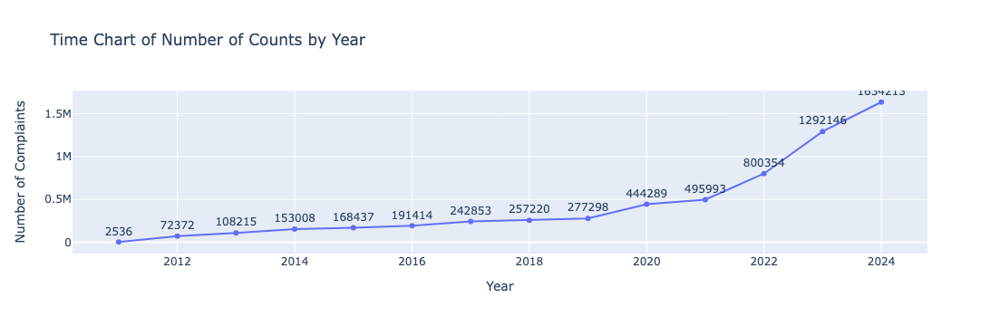

In [45]:
import plotly.express as px
import pandas as pd

# Assuming df is your dataframe and 'year' column exists
year_counts = df['year'].value_counts().sort_index()

# Convert to a DataFrame
year_counts_df = year_counts.reset_index()
year_counts_df.columns = ['Year', 'Count']

# Create a line plot using Plotly
fig = px.line(year_counts_df, x='Year', y='Count', title='Time Chart of Number of Counts by Year',
              labels={'Year': 'Year', 'Count': 'Number of Complaints'})

# Add text labels for each data point
fig.update_traces(text=year_counts_df['Count'], textposition='top center', mode='lines+markers+text')

fig.show()


In [23]:
# Remove Unwanted Data
filtered_df = df.dropna()
filtered_df.head()

,Product,Sub-product,Issue,Sub-issue,Consumer complaint narrative,Company public response,Company,State,ZIP code,Date received
960,Credit reporting or other personal consumer re...,Credit reporting,Incorrect information on your report,Information belongs to someone else,I have recently discovered that there is unaut...,Company has responded to the consumer and the ...,Experian Information Solutions Inc.,GA,30331,2024-07-15
963,Credit reporting or other personal consumer re...,Credit reporting,Incorrect information on your report,Information belongs to someone else,I recently reviewed a copy of my credit report...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",CA,92220,2024-08-06
980,Credit card,Store credit card,Problem when making payments,Problem during payment process,I am submitting this complaint against Sams Cl...,Company has responded to the consumer and the ...,SYNCHRONY FINANCIAL,AZ,86004,2024-07-24
983,Credit card,General-purpose credit card or charge card,Getting a credit card,Card opened without my consent or knowledge,I did not obtain any goods or services from th...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",FL,33141,2024-08-06
985,Debt collection,I do not know,Attempts to collect debt not owed,Debt is not yours,I want to stress that I did not give written p...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",FL,328XX,2024-08-08


In [24]:
filtered_df.shape, df.shape

((993822, 10), (6140348, 10))

# Product / Sub-product

In [27]:
product_mappings = {
    'Credit reporting, credit repair services, or other personal consumer reports': 'Credit reporting',
    'Credit reporting or other personal consumer reports': 'Credit reporting',
    
    'Credit card or prepaid card': 'Credit/Prepaid Card',
    'Prepaid card': 'Credit/Prepaid Card',
    'Credit card': 'Credit/Prepaid Card',
    
    'Payday loan, title loan, or personal loan': 'Loans/Mortgage',
    'Payday loan, title loan, personal loan, or advance loan': 'Loans/Mortgage',
    'Mortgage': 'Loans/Mortgage',
    'Student loan': 'Loans/Mortgage',
    'Vehicle loan or lease': 'Loans/Mortgage',
    'Consumer Loan': 'Loans/Mortgage'
}

filtered_df.loc[:, 'Product'] = filtered_df['Product'].map(product_mappings)

In [33]:
# Get the value counts of 'Sub-product'
sub_product_counts = filtered_df['Sub-product'].value_counts()

# Filter to keep only 'Sub-product' values with count >= 1000
valid_sub_products = sub_product_counts[sub_product_counts >= 1000].index

# Filter the DataFrame to include only these valid 'Sub-product' values
filtered_df = filtered_df[filtered_df['Sub-product'].isin(valid_sub_products)]

# Issue	/ Sub-issue

In [62]:
# Get the value counts of combinations of 'Issue' and 'Sub-issue'
issue_subissue_counts = filtered_df[['Issue', 'Sub-issue']].value_counts()

# Filter to get combinations that occur more than or equal to 5000 times
valid_combinations = issue_subissue_counts[issue_subissue_counts >= 5000].index

# Filter the DataFrame to include only valid combinations (without setting the index)
filtered_df = filtered_df[filtered_df[['Issue', 'Sub-issue']].apply(tuple, axis=1).isin(valid_combinations)]
filtered_df

,Product,Sub-product,Issue,Sub-issue,Consumer complaint narrative,Company public response,Company,State,ZIP code,Date received
960,Credit reporting,Credit reporting,Incorrect information on your report,Information belongs to someone else,I have recently discovered that there is unaut...,Company has responded to the consumer and the ...,Experian Information Solutions Inc.,GA,30331,2024-07-15
963,Credit reporting,Credit reporting,Incorrect information on your report,Information belongs to someone else,I recently reviewed a copy of my credit report...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",CA,92220,2024-08-06
985,NaN,I do not know,Attempts to collect debt not owed,Debt is not yours,I want to stress that I did not give written p...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",FL,328XX,2024-08-08
1002,Credit reporting,Credit reporting,Problem with a company's investigation into an...,Investigation took more than 30 days,In accordance with the Fair Credit Reporting a...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",CA,92883,2024-08-08
1282,Credit reporting,Credit reporting,Problem with a company's investigation into an...,Their investigation did not fix an error on yo...,I am writing to bring to your attention a XXXX...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",MD,XXXXX,2024-08-09
...,...,...,...,...,...,...,...,...,...,...
6140325,Credit reporting,Credit reporting,Problem with a credit reporting company's inve...,Their investigation did not fix an error on yo...,"Despite multiple written requests, the unverif...",Company has responded to the consumer and the ...,Experian Information Solutions Inc.,MO,63121,2022-08-19
6140326,Credit reporting,Credit reporting,Problem with a credit reporting company's inve...,Investigation took more than 30 days,I became a victim of identity theft couple of ...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",CA,925XX,2022-01-04
6140328,Credit reporting,Credit reporting,Problem with a credit reporting company's inve...,Was not notified of investigation status or re...,On XX/XX/XXXX I sent Experian a letter of rein...,Company has responded to the consumer and the ...,Experian Information Solutions Inc.,MD,20602,2022-06-21
6140337,Credit reporting,Credit reporting,Improper use of your report,Reporting company used your report improperly,In accordance with the fair crediting reportin...,Company has responded to the consumer and the ...,Experian Information Solutions Inc.,CO,80918,2022-06-21


In [79]:
# Strip spaces from the relevant columns
filtered_df['Product'] = filtered_df['Product'].str.strip()
filtered_df['Sub-product'] = filtered_df['Sub-product'].str.strip()
filtered_df['Issue'] = filtered_df['Issue'].str.strip()
filtered_df['Sub-issue'] = filtered_df['Sub-issue'].str.strip()

# Remove rows where any of 'Product', 'Sub-product', 'Issue', or 'Sub-issue' are empty or only spaces
filtered_df = filtered_df[
    (filtered_df['Product'] != '') &
    (filtered_df['Sub-product'] != '') &
    (filtered_df['Issue'] != '') &
    (filtered_df['Sub-issue'] != '')
]

# Consumer Complaint Narrative

In [63]:
# Create new columns for word counts
filtered_df.loc[:, 'narrative_word_count'] = filtered_df['Consumer complaint narrative'].apply(lambda x: len(str(x).split()))

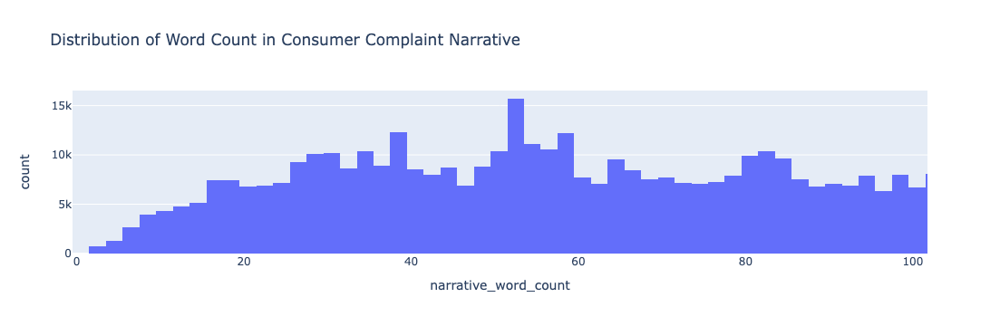

In [64]:
# Plot the histogram for 'narrative_word_count'
fig_narrative = px.histogram(filtered_df, x='narrative_word_count', title="Distribution of Word Count in Consumer Complaint Narrative")
fig_narrative.show()

In [74]:
filtered_df = filtered_df[filtered_df['narrative_word_count'] >= 30]
filtered_df

,Product,Sub-product,Issue,Sub-issue,Consumer complaint narrative,Company public response,Company,State,ZIP code,Date received,narrative_word_count
960,Credit reporting,Credit reporting,Incorrect information on your report,Information belongs to someone else,I have recently discovered that there is unaut...,Company has responded to the consumer and the ...,Experian Information Solutions Inc.,GA,30331,2024-07-15,144
963,Credit reporting,Credit reporting,Incorrect information on your report,Information belongs to someone else,I recently reviewed a copy of my credit report...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",CA,92220,2024-08-06,33
985,,I do not know,Attempts to collect debt not owed,Debt is not yours,I want to stress that I did not give written p...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",FL,328XX,2024-08-08,163
1002,Credit reporting,Credit reporting,Problem with a company's investigation into an...,Investigation took more than 30 days,In accordance with the Fair Credit Reporting a...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",CA,92883,2024-08-08,157
1282,Credit reporting,Credit reporting,Problem with a company's investigation into an...,Their investigation did not fix an error on yo...,I am writing to bring to your attention a XXXX...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",MD,XXXXX,2024-08-09,203
...,...,...,...,...,...,...,...,...,...,...,...
6140325,Credit reporting,Credit reporting,Problem with a credit reporting company's inve...,Their investigation did not fix an error on yo...,"Despite multiple written requests, the unverif...",Company has responded to the consumer and the ...,Experian Information Solutions Inc.,MO,63121,2022-08-19,111
6140326,Credit reporting,Credit reporting,Problem with a credit reporting company's inve...,Investigation took more than 30 days,I became a victim of identity theft couple of ...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",CA,925XX,2022-01-04,87
6140328,Credit reporting,Credit reporting,Problem with a credit reporting company's inve...,Was not notified of investigation status or re...,On XX/XX/XXXX I sent Experian a letter of rein...,Company has responded to the consumer and the ...,Experian Information Solutions Inc.,MD,20602,2022-06-21,252
6140337,Credit reporting,Credit reporting,Improper use of your report,Reporting company used your report improperly,In accordance with the fair crediting reportin...,Company has responded to the consumer and the ...,Experian Information Solutions Inc.,CO,80918,2022-06-21,55


# EDA

In [81]:
filtered_df['State'].value_counts()

State
FL    101088
TX     86317
CA     81018
GA     60694
NY     44422
       ...  
GU        30
FM        11
MP         4
AA         3
AS         2
Name: count, Length: 61, dtype: int64

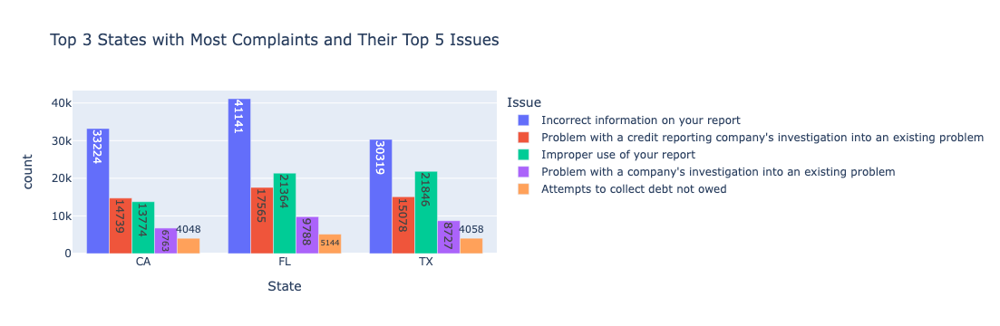

In [94]:

# Top 5 states with most complaints and their top 5 issues
# -----------------------------------------------------------
top_5_states = filtered_df['State'].value_counts().nlargest(3).index
df_top_states = filtered_df[filtered_df['State'].isin(top_5_states)]

# Group by state and issue
state_issue_counts = df_top_states.groupby(['State', 'Issue']).size().reset_index(name='count')

# Find top 5 issues for each of the top 5 states
state_issue_top5 = state_issue_counts.groupby('State').apply(lambda x: x.nlargest(5, 'count')).reset_index(drop=True)

# Plotting top issues in top 5 states
fig_state_issues = px.bar(state_issue_top5, x='State', y='count', color='Issue', barmode='group',
                          title="Top 3 States with Most Complaints and Their Top 5 Issues",
                          text='count')  # Add text labels on the bars

# Customize the layout to make the text visible on top of the bars
fig_state_issues.update_traces(textposition='auto')

# Show the figure
fig_state_issues.show()

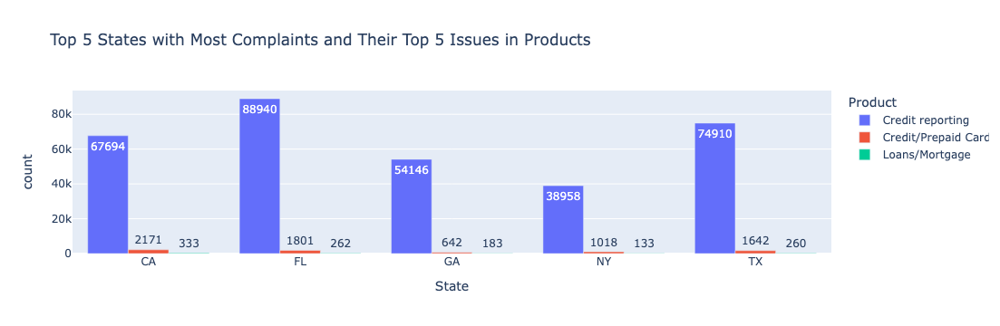

In [91]:

# Top 5 states with most complaints and their top 5 issues in products
# -----------------------------------------------------------
top_5_states = filtered_df['State'].value_counts().nlargest(5).index
df_top_states = filtered_df[filtered_df['State'].isin(top_5_states)]

# Group by state and Product
state_issue_counts = df_top_states.groupby(['State', 'Product']).size().reset_index(name='count')

# Find top 5 Product for each of the top 5 states
state_issue_top5 = state_issue_counts.groupby('State').apply(lambda x: x.nlargest(5, 'count')).reset_index(drop=True)

# Plotting top issues in top 5 states
fig_state_issues = px.bar(state_issue_top5, x='State', y='count', color='Product', barmode='group',
                          title="Top 5 States with Most Complaints and Their Top 5 Issues in Products",
                          text='count')  # Add text on the bars

# Customize the layout to make the text visible
fig_state_issues.update_traces(textposition='auto')

# Show the figure
fig_state_issues.show()

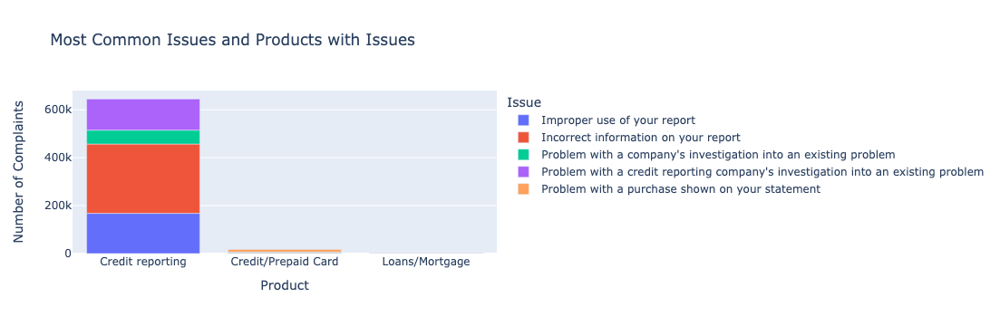

In [84]:
# Overall Most Common Issues and Products
# ------------------------------------------
# Group by Product and Issue
product_issue_counts = filtered_df.groupby(['Product', 'Issue']).size().reset_index(name='count')

# Plotting most common issues and products
fig_common_issues = px.bar(product_issue_counts, x='Product', y='count', color='Issue',
                           title="Most Common Issues and Products with Issues",
                           labels={'count': 'Number of Complaints'})
fig_common_issues.show()

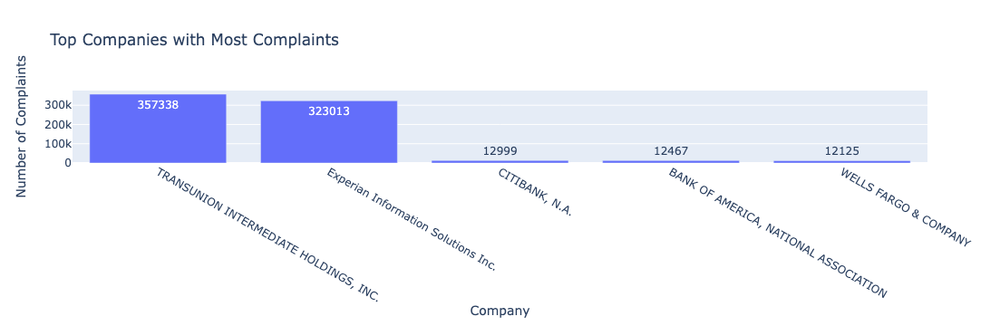

In [89]:
# Company with the Most Complaints
# -----------------------------------
# Group by company
company_complaints = df_filtered['Company'].value_counts().reset_index()
company_complaints.columns = ['Company', 'Complaint Count']

# Plotting companies with most complaints
fig_company_complaints = px.bar(company_complaints.head(5), 
                                x='Company', 
                                y='Complaint Count',
                                title="Top Companies with Most Complaints",
                                labels={'Complaint Count': 'Number of Complaints'},
                                text='Complaint Count')  # Add text on the bars

# Customize the layout to make the text visible
fig_company_complaints.update_traces(textposition='auto')

# Show the figure
fig_company_complaints.show()

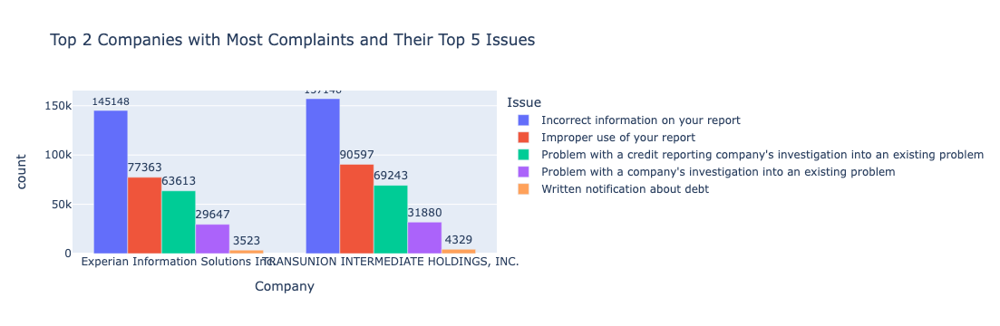

In [97]:
top_5_companies = df_filtered['Company'].value_counts().nlargest(2).index
df_top_companies = df_filtered[df_filtered['Company'].isin(top_5_companies)]

# 2. Group by company and issue, and count the occurrences
company_issue_counts = df_top_companies.groupby(['Company', 'Issue']).size().reset_index(name='count')

# 3. Get the top 5 issues for each of the top 5 companies
company_issue_top5 = company_issue_counts.groupby('Company').apply(lambda x: x.nlargest(5, 'count')).reset_index(drop=True)

# 4. Plotting top issues in top 5 companies, and displaying the numbers on the bars
fig_company_issues = px.bar(company_issue_top5, x='Company', y='count', color='Issue', barmode='group',
                            title="Top 2 Companies with Most Complaints and Their Top 5 Issues",
                            text='count')  # Add text on the bars

# Customize the layout to make the text visible
fig_company_issues.update_traces(textposition='outside')

# Show the figure
fig_company_issues.show()

# Classes

In [104]:
filtered_df[['Product', 'Sub-product', 'Issue', 'Sub-issue']].nunique()

Product         3
Sub-product    25
Issue          10
Sub-issue      24
dtype: int64

In [107]:
filtered_df.to_csv(FINAL_DATA_FOLDER / 'filtered_complaints.csv', index = False)